In [120]:
#load trained model
import gensim.models.word2vec as w2v

model = w2v.Word2Vec.load(r'C:/Users/BeatrizCarvalho/OneDrive - Closer Consultoria Lda/Documents/Entangled-Spaces/Datasets/3transfers_word2vec_matrix_originalcols.w2v')

In [7]:
#TSNE - all words
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def tsne_plot(model):
    
    labels = []
    tokens = []
    
    #extract words and their vectors from the trained model 
    for word in model.wv.index_to_key:
        tokens.append(model.wv[word])
        labels.append(word)
    
    #TSNE
    tsne_model = TSNE(perplexity = 40, n_components = 2, init = 'pca', n_iter = 2500, random_state = 23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize = (50, 50))
    
    for i in range(len(x)):
        plt.scatter(x[i], y[i])
        plt.annotate(labels[i], xy = (x[i], y[i]), xytext = (5, 2), textcoords = 'offset points', ha = 'right', va = 'bottom')
              
        
    plt.show()

C:\Users\BeatrizCarvalho\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\BeatrizCarvalho\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


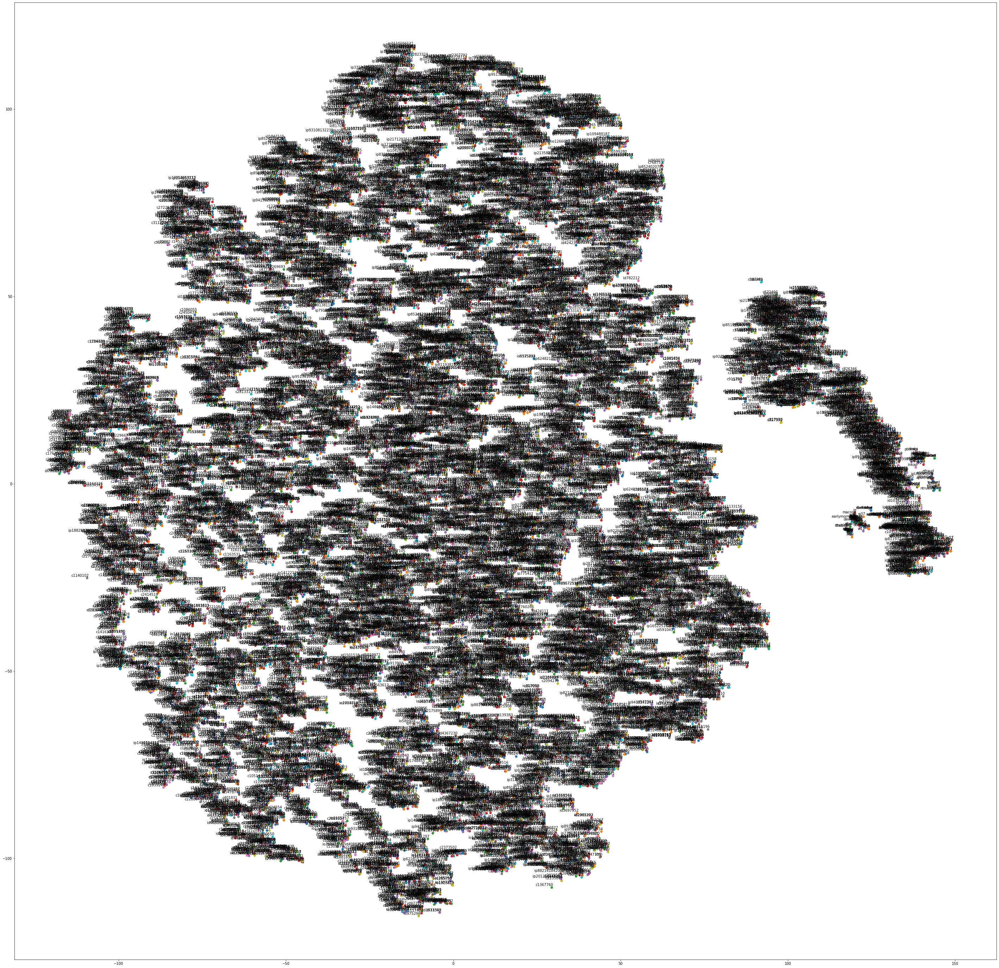

In [8]:
#continuation of the above
tsne_plot(model)

C:\Users\BeatrizCarvalho\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\BeatrizCarvalho\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



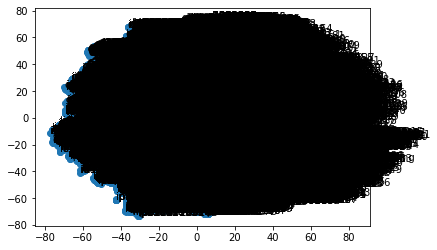

In [30]:
#TSNE - all words
from sklearn.manifold import TSNE
import pandas as pd
import matplotlib.pyplot as plt

#gets a standalone vocab list for the final dataframe to plot
vocab = list(model.wv.key_to_index)

#index model to make sure you know the order of the words
X = model.wv[vocab]

tsne = TSNE(n_components = 2)
X_tsne = tsne.fit_transform(X)

#vocab words are the indices of the dataframe now
df = pd.DataFrame(X_tsne, index = vocab, columns = ['x', 'y'])

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)

ax.scatter(df['x'], df['y'])

#annotate to label coordinates
for word, pos in df.iterrows():
    ax.annotate(word, pos)
    
plt.show()

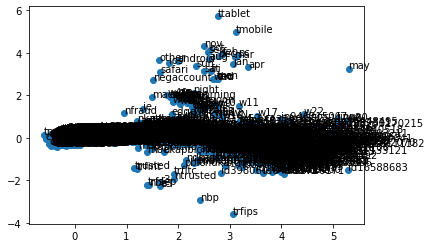

In [21]:
#PCA - all words
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

X = model.wv[model.wv.index_to_key]
pca = PCA(n_components = 2)
result = pca.fit_transform(X)

plt.scatter(result[:, 0], result[:, 1])

words = list(model.wv.index_to_key)

for i, word in enumerate(words):
    plt.annotate(word, xy = (result[i, 0], result[i, 1]))
    
plt.show()

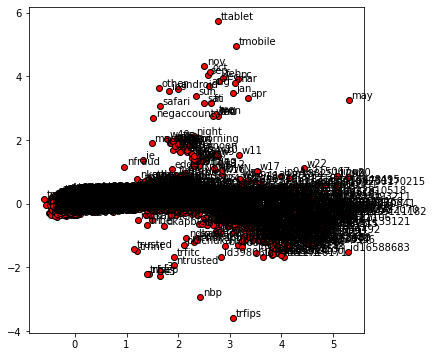

In [44]:
#PCA - all words
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def display_pca_scatterplot(model, words = None, sample = 0):
    if words == None:
        if sample > 0:
            words = np.random.choice(list(model.wv.index_to_key), sample)
        else:
            words = [word for word in model.wv.index_to_key]
        
    word_vectors = np.array([model.wv[w] for w in words])

    twodim = PCA().fit_transform(word_vectors)[:, :2]
    
    plt.figure(figsize = (6,6))
    plt.scatter(twodim[:,0], twodim[:,1], edgecolors = 'k', c = 'r')
    
    for word, (x,y) in zip(words, twodim):
        plt.text(x + 0.05, y + 0.05, word)
        
display_pca_scatterplot(model)  #sample = 300

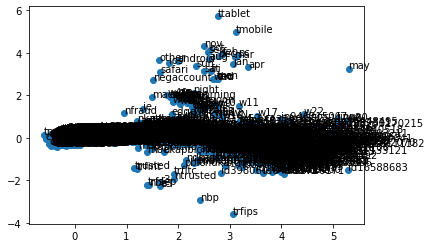

In [68]:
#PCA-all words
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

pca = PCA(n_components = 2)
pca.fit(model.wv.vectors)
results = pca.transform(model.wv.vectors)

x = np.transpose(results).tolist()[0]
y = np.transpose(results).tolist()[1]

n = list(model.wv.index_to_key)
fig, ax = plt.subplots()
ax.scatter(x, y)

for i, txt in enumerate(n):
    ax.annotate(txt,(x[i],y[i]))

#plt.savefig('word_vectors_in_2D_space.png')
plt.show()

In [61]:
model.wv.get_index('nfraud', default=None)

7

In [125]:
#TSNE - part 1
#select 2 words
keys = ['fraud', 'nfraud']

#vectors and labels
embedding_clusters = []
word_clusters = []

for word in keys:
    embeddings = []
    words = []
    
    #get and store similar words and their vectors
    for similar_word, _ in model.wv.most_similar(word, topn = 20):
        words.append(similar_word)
        embeddings.append(model.wv[similar_word])
    embedding_clusters.append(embeddings)
    word_clusters.append(words)
    
embedding_clusters = np.array(embedding_clusters)
n, m, k = embedding_clusters.shape

#TSNE
tsne_model_en_2d = TSNE(perplexity = 50, n_components = 2, init = 'pca', n_iter = 3500, random_state = 32)
embeddings_en_2d = np.array(tsne_model_en_2d.fit_transform(embedding_clusters.reshape(n * m, k))).reshape(n, m, 2)

C:\Users\BeatrizCarvalho\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

C:\Users\BeatrizCarvalho\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



In [126]:
#plot function - part 2
def tsne_plot_similar_words(labels, embedding_clusters, word_clusters, a, filename = None):
    plt.figure(figsize = (16, 9))
    colors = cm.rainbow(np.linspace(0, 1, len(labels)))
    
    for label, embeddings, words, color in zip(labels, embedding_clusters, word_clusters, colors):
        x = embeddings[:, 0]
        y = embeddings[:, 1]
        plt.scatter(x, y, c = color, alpha = a, label = label)
        for i, word in enumerate(words):
            plt.annotate(word, alpha = 0.5, xy = (x[i], y[i]), xytext = (5, 2), textcoords = 'offset points', ha = 'right',
                         va = 'bottom', size = 8)
    plt.legend()
    plt.xlabel("dimension 1")
    plt.ylabel("dimension 2")
    
    if filename:
        plt.savefig(filename, format = 'png', dpi = 150, bbox_inches = 'tight')
    plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


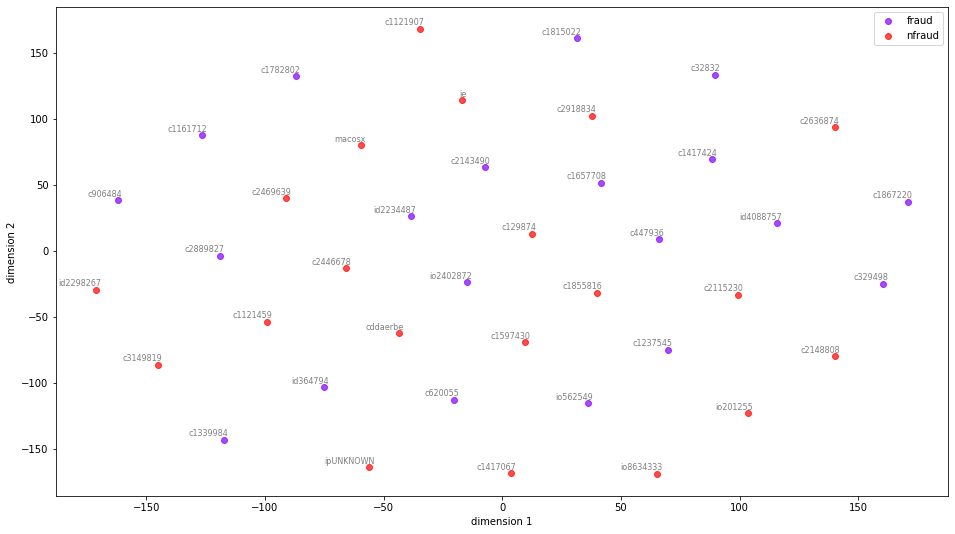

In [127]:
#plot - part 3
tsne_plot_similar_words(keys, embeddings_en_2d, word_clusters, 0.7) #'similar_words.png'

In [141]:
#TSNE - part 1 - differs from the above in the perplexity that compresses points more closer and no labels (without for)
#perplexity - how many neighbors will affect a point, preserves the distances of those neighbors
#select 2 words
keys = ['fraud', 'nfraud', 'pc', 'android', 'windows']

#vectors and labels
embedding_clusters = []
word_clusters = []

for word in keys:
    embeddings = []
    words = []
    
    #get and store similar words and their vectors
    for similar_word, _ in model.wv.most_similar(word, topn = 20):
        words.append(similar_word)
        embeddings.append(model.wv[similar_word])
    embedding_clusters.append(embeddings)
    word_clusters.append(words)
    
embedding_clusters = np.array(embedding_clusters)
n, m, k = embedding_clusters.shape

#TSNE
tsne_model_en_2d = TSNE(perplexity = 15, n_components = 2, init = 'pca', n_iter = 3500, random_state = 32)  #perplexity = 15
embeddings_en_2d = np.array(tsne_model_en_2d.fit_transform(embedding_clusters.reshape(n * m, k))).reshape(n, m, 2)

C:\Users\BeatrizCarvalho\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

C:\Users\BeatrizCarvalho\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



In [142]:
#plot function - part 2
def tsne_plot_similar_words(labels, embedding_clusters, word_clusters, a, filename = None):
    plt.figure(figsize = (16, 9))
    colors = cm.rainbow(np.linspace(0, 1, len(labels)))
    
    for label, embeddings, words, color in zip(labels, embedding_clusters, word_clusters, colors):
        x = embeddings[:, 0]
        y = embeddings[:, 1]
        plt.scatter(x, y, c = color, alpha = a, label = label)
        
    plt.legend()
    plt.xlabel("dimension 1")
    plt.ylabel("dimension 2")
    
    if filename:
        plt.savefig(filename, format = 'png', dpi = 150, bbox_inches = 'tight')
    plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

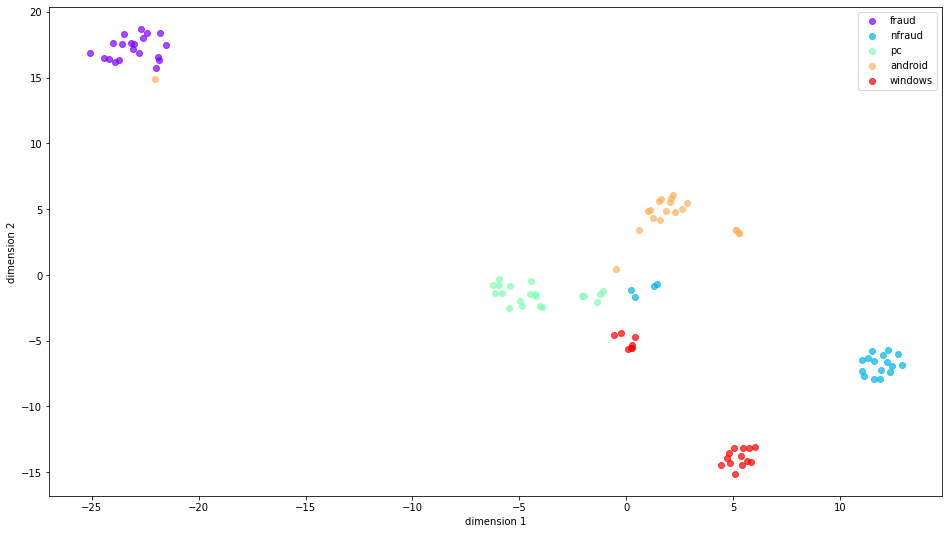

In [143]:
#plot - part 3
tsne_plot_similar_words(keys, embeddings_en_2d, word_clusters, 0.7) #'similar_words.png'